In [114]:
from fastai import *
from fastai.vision import *
from fastai.metrics import error_rate,accuracy
import os
import torch
from tqdm import tqdm_notebook
import shutil
import matplotlib.pyplot as plt
torch.cuda.empty_cache()

In [6]:
DATA_PATH = "./imgs/"

In [7]:
os.listdir(DATA_PATH)

['test', 'train']

In [8]:
# we have to create a validation set to pass into the data Bunch

all_images_classes = os.listdir(DATA_PATH+"train")

print(all_images_classes)

['c0', 'c1', 'c2', 'c3', 'c4', 'c5', 'c6', 'c7', 'c8', 'c9']


In [9]:
# make a dictionary for classes
classes = {
"c0": "safe driving",
"c1": "texting - right",
"c2": "talking on the phone - right",
"c3": "texting - left",
"c4": "talking on the phone - left",
"c5": "operating the radio",
"c6": "drinking",
"c7": "reaching behind",
"c8": "hair and makeup",
"c9": "talking to passenger"}

In [11]:
# store all the images in a list and then randomly pick 10 % data from each folder and put it for validation

def create_validation(yes = False):
    if yes:
        
        if os.path.isdir(DATA_PATH+"valid") == False:
            os.mkdir(DATA_PATH+"valid")

        for i,c in enumerate(tqdm(all_images_classes)):
            # make the class folder in the validation folder
            if os.path.isdir(DATA_PATH+f"valid/{c}") == False:
                os.mkdir(DATA_PATH+f"valid/{c}")

            # get all the images name from the train folder
            all_images = os.listdir(DATA_PATH+f"train/{c}")

            # get 3 % images randomly to put in validation folder
            sample_validation  = np.random.choice(all_images,(len(all_images) * 3) // 100)

        #     print(f"total images size = {len(all_images)}")
        #     print(f"sample image size = {len(sample_validation)}")

            # loop throught the sample images list and move them to the validation folder
            source_path = DATA_PATH+f"train/{c}/"
            destination_path = DATA_PATH+f"valid/{c}/"

            for image in sample_validation:
                if os.path.isfile(destination_path+image) == False:
                    shutil.move(source_path+image,destination_path)
    else:
        print("Validation not created!!")
        
    
create_validation(True)   

100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 28.17it/s]


In [13]:
batch_size = 64
data = ImageDataBunch.from_folder(DATA_PATH,train='train',valid="valid",ds_tfms= get_transforms(), \
                                  size=224,bs = batch_size).normalize(imagenet_stats)

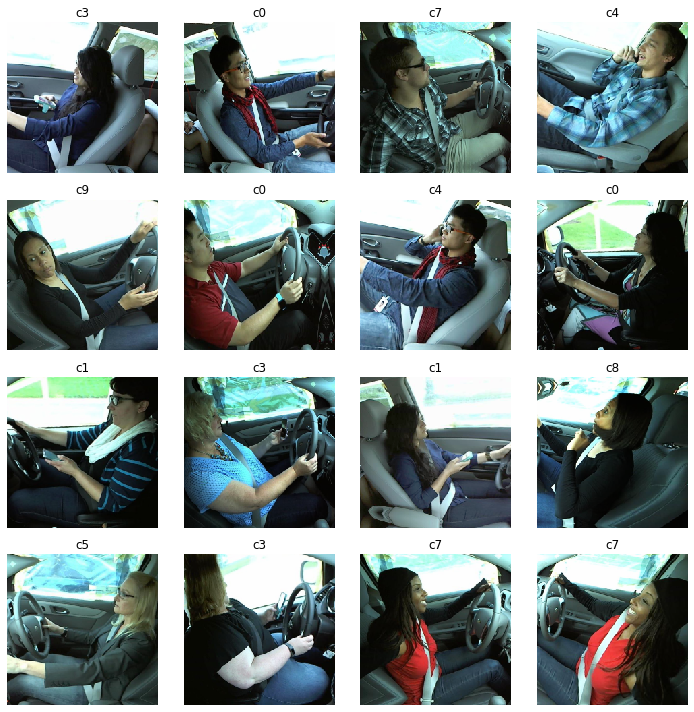

In [14]:
data.show_batch(rows=4, figsize=(10,10))

In [15]:
print(data.classes)
len(data.classes),data.c

['c0', 'c1', 'c2', 'c3', 'c4', 'c5', 'c6', 'c7', 'c8', 'c9']


(10, 10)

In [123]:
# cnn_learner??

In [16]:
learn = cnn_learner(data, models.resnet50, metrics=[error_rate,accuracy])

In [17]:
learn.model

Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
          (0): Conv2d(64, 256

In [102]:
# learn.fit_one_cycle??

In [49]:
# ImageDataBunch??

In [18]:
learn.fit_one_cycle(3)

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.485028,0.151238,0.045386,0.954614,04:40
1,0.215435,0.058112,0.013616,0.986384,04:31
2,0.116111,0.035333,0.009077,0.990923,04:29


In [19]:
learn.save("Stage_1")

In [20]:
# getting an model interpreter from the learn

interp = ClassificationInterpretation.from_learner(learn)

losses,idxs = interp.top_losses()

len(data.valid_ds)==len(losses)==len(idxs)

True

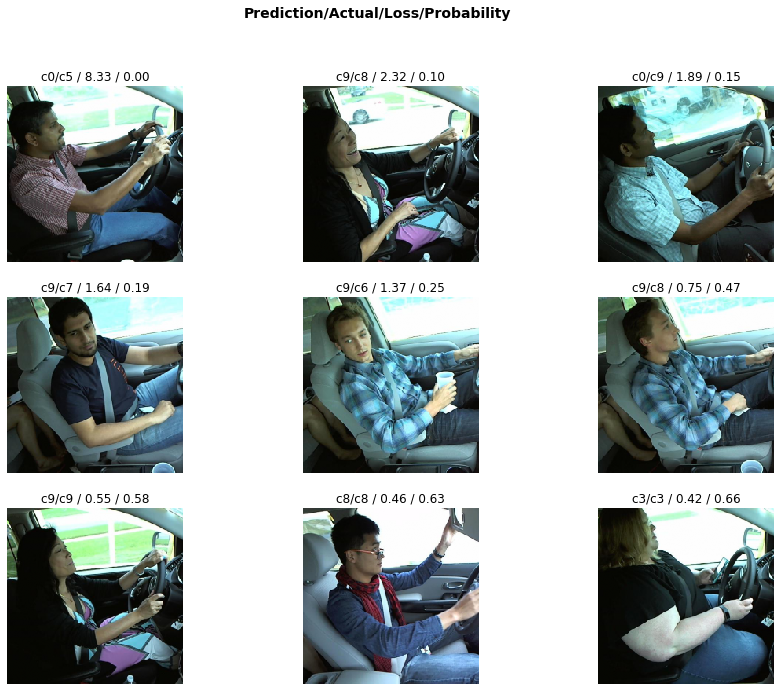

In [21]:
interp.plot_top_losses(9, figsize=(15,11))

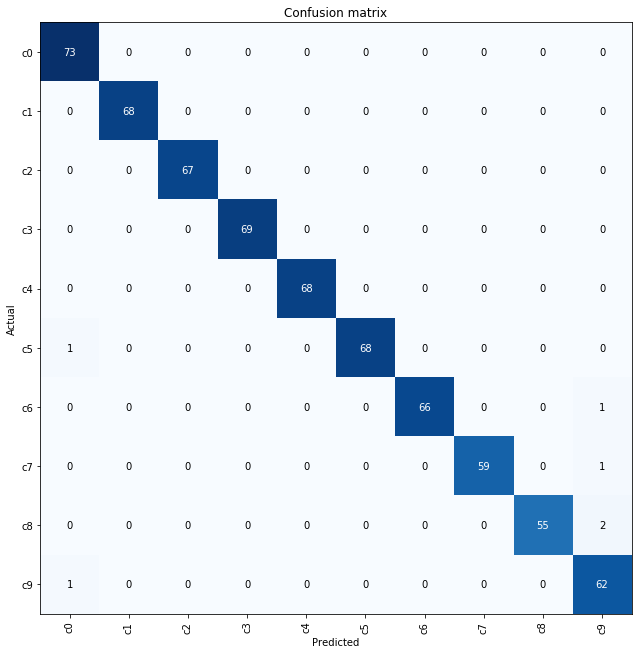

In [22]:
interp.plot_confusion_matrix(figsize=(9,9))

In [23]:
# learn.lr_find()
# learn.recorder.plot()

In [63]:
torch.cuda.empty_cache()

In [64]:
# export the model to a pkl file

learn.export()

In [117]:
defaults.device = torch.device('cuda:0')

In [66]:
def imshow(img):
    plt.imshow(np.transpose(img, (1, 2, 0)))
    plt.show()

In [104]:
def inference(image_path,model_path):
    
    learn = load_learner(model_path)

    img = open_image(image_path)
    
    imshow(img.data)
    
    pred_class,pred_idx,outputs = learn.predict(img)
    
    return classes[str(pred_class)]
    

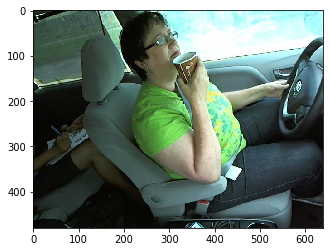

talking on the phone - right


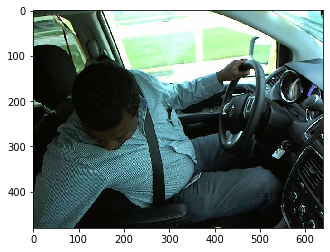

reaching behind


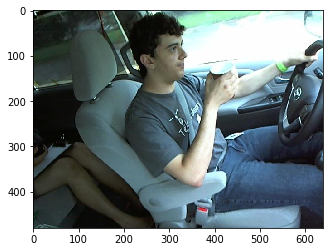

drinking


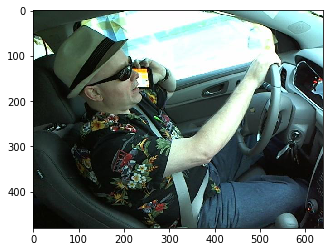

drinking


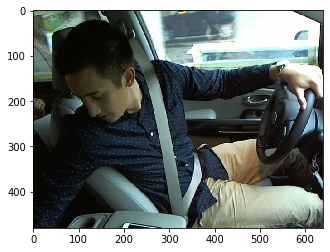

reaching behind


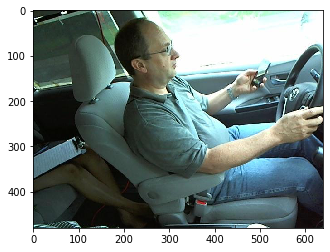

texting - left


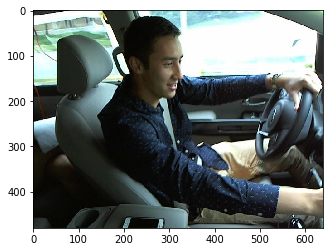

operating the radio


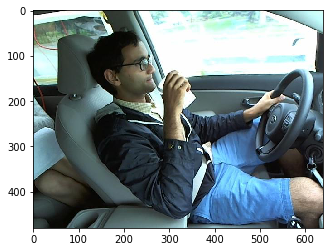

drinking


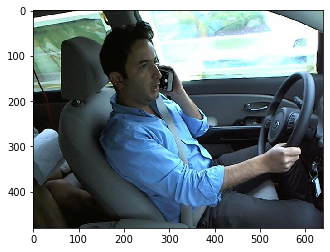

talking on the phone - left


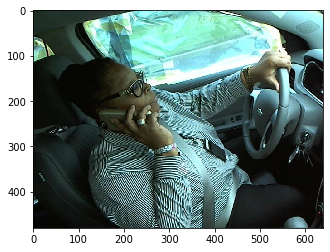

talking on the phone - right


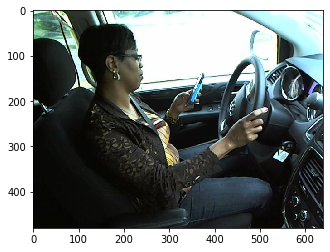

texting - left


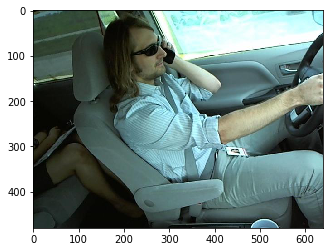

talking on the phone - left


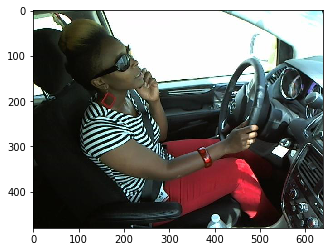

talking on the phone - left


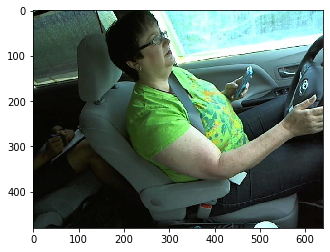

texting - left


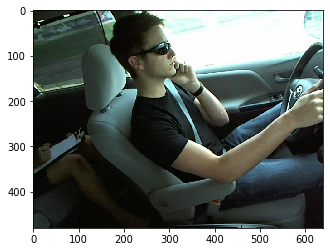

talking on the phone - left


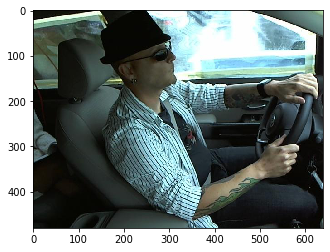

safe driving


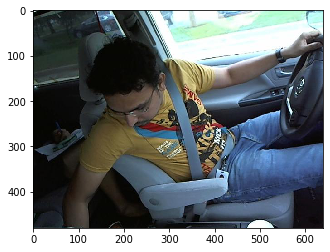

reaching behind


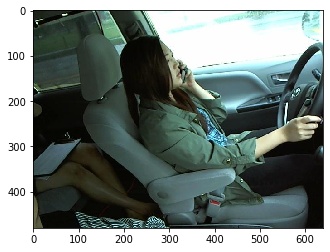

talking on the phone - left


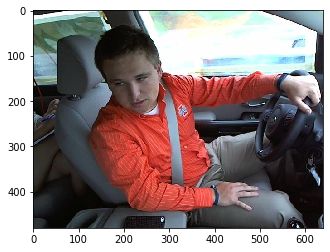

talking to passenger


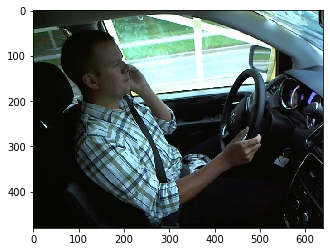

talking on the phone - left


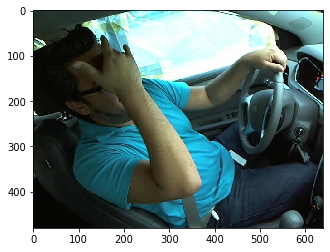

hair and makeup


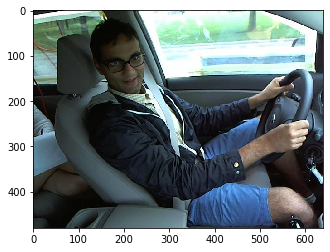

talking to passenger


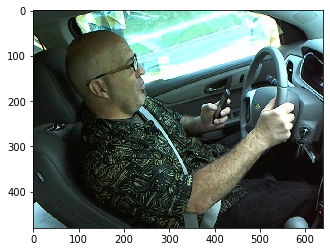

texting - left


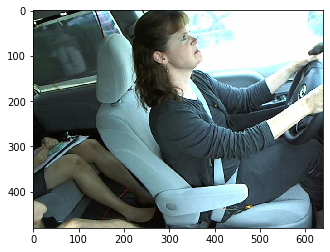

safe driving


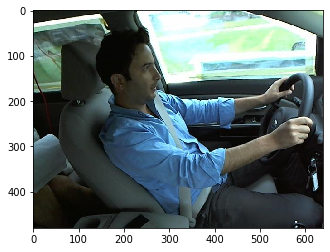

safe driving


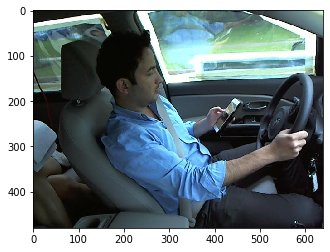

texting - left


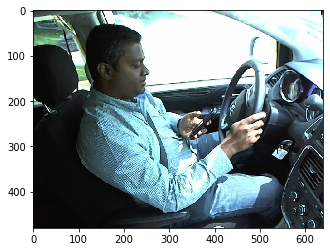

texting - left


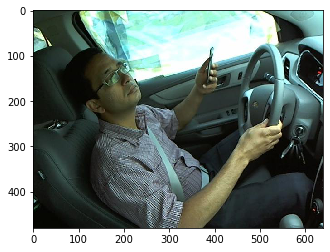

texting - right


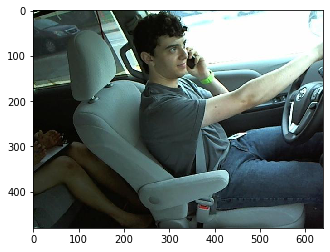

talking to passenger


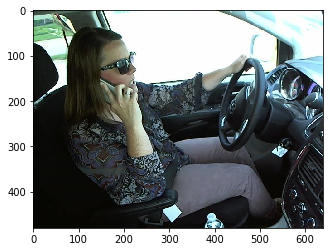

talking on the phone - right


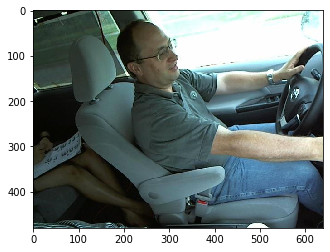

operating the radio


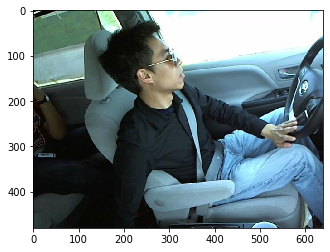

reaching behind


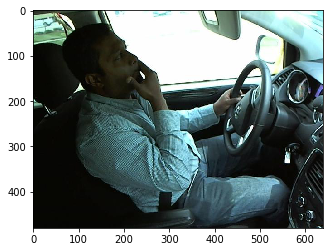

hair and makeup


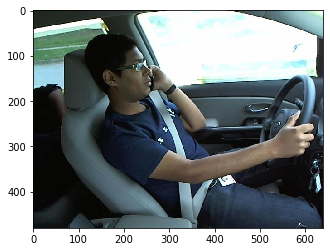

talking on the phone - left


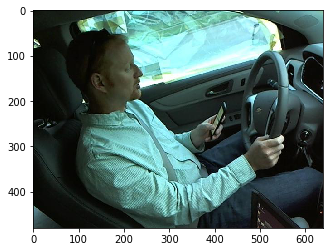

texting - left


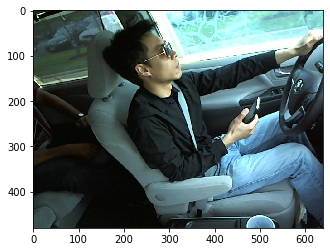

texting - right


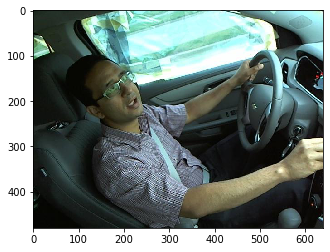

operating the radio


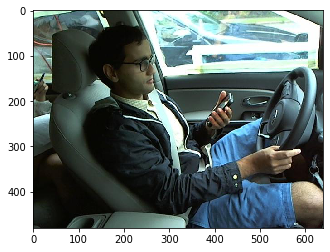

texting - left


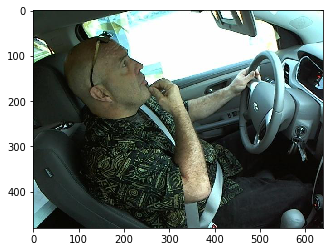

hair and makeup


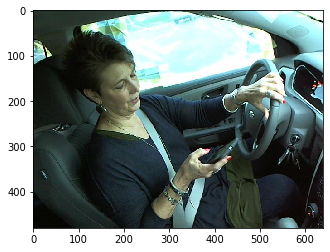

texting - right


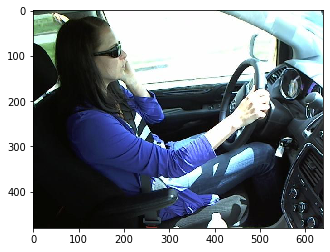

talking on the phone - left


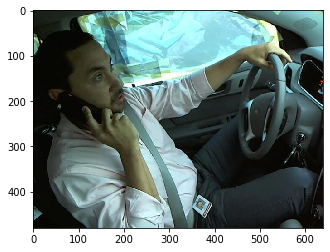

hair and makeup


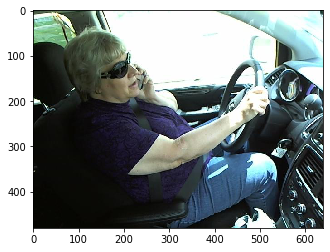

talking on the phone - left


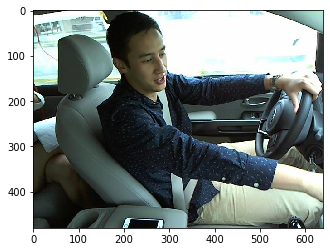

operating the radio


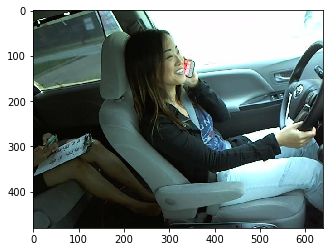

talking on the phone - left


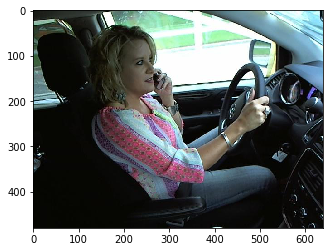

talking on the phone - left


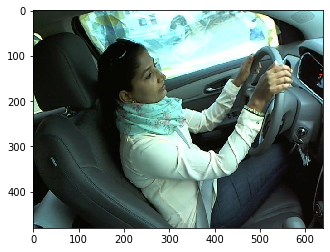

safe driving


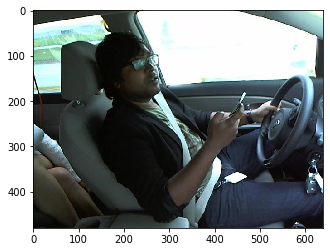

texting - right


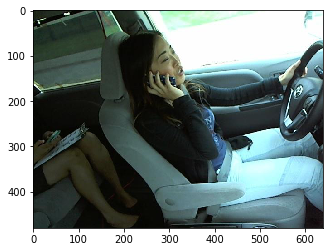

talking on the phone - right


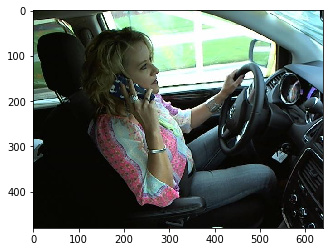

talking on the phone - right


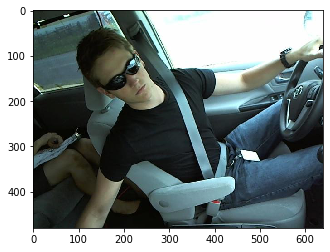

reaching behind


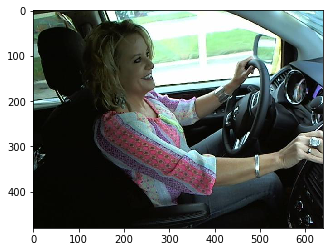

operating the radio


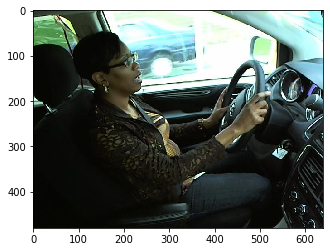

texting - left


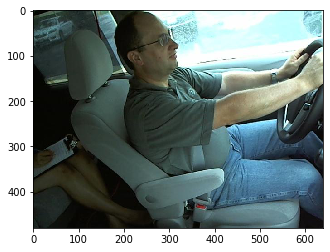

operating the radio


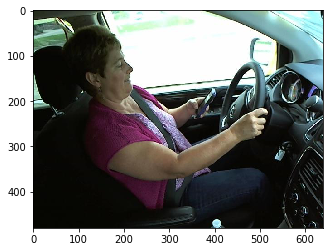

texting - left


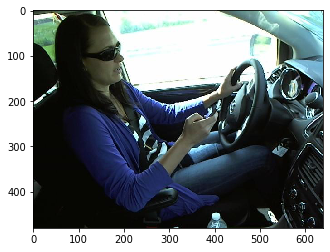

texting - right


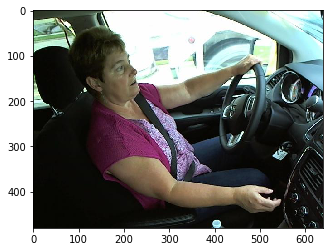

operating the radio


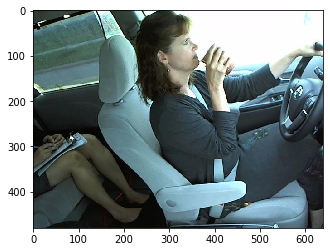

drinking


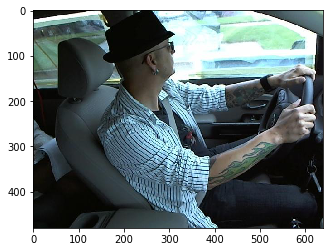

safe driving


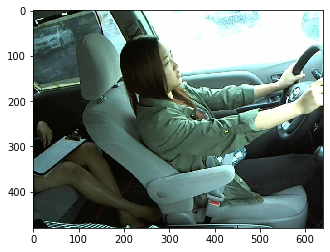

safe driving


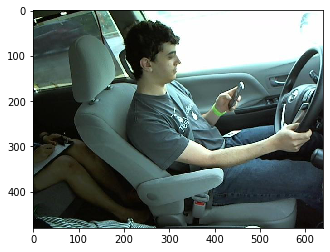

texting - left


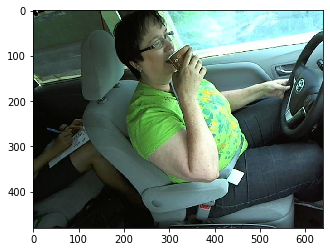

texting - right


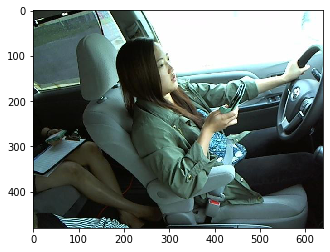

talking on the phone - right


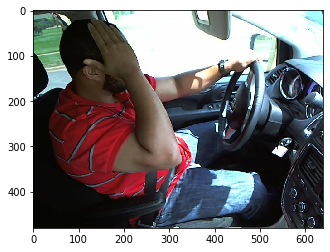

hair and makeup


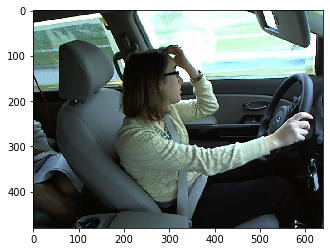

hair and makeup


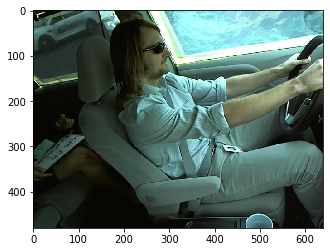

safe driving


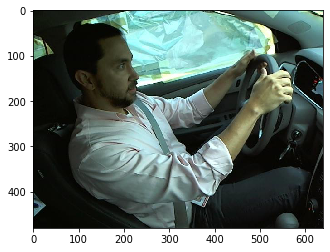

safe driving


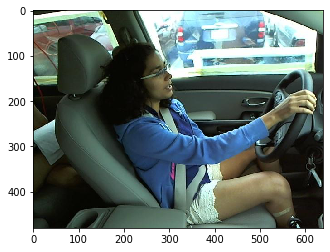

safe driving


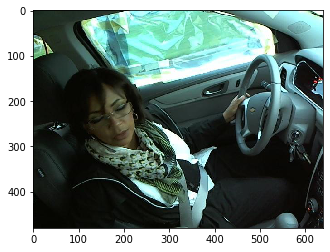

reaching behind


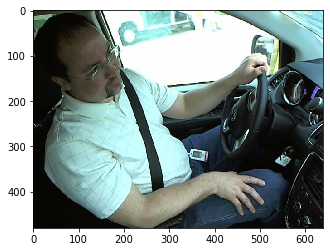

talking to passenger


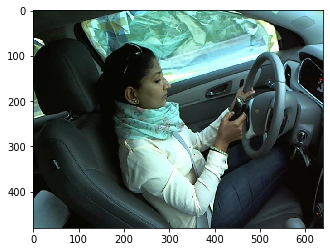

texting - right


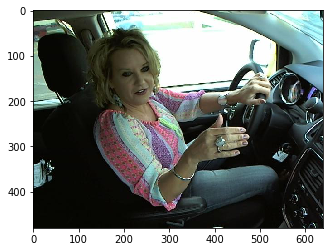

talking to passenger


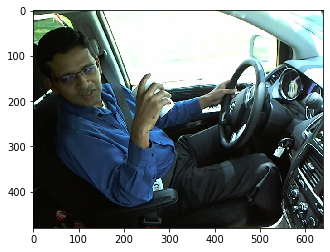

drinking


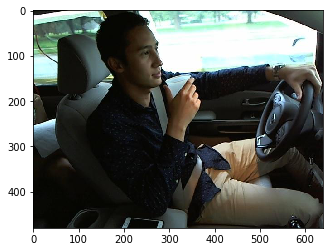

drinking


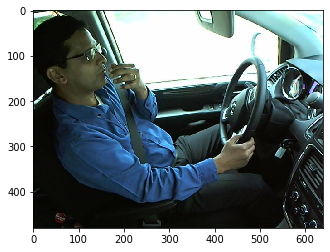

hair and makeup


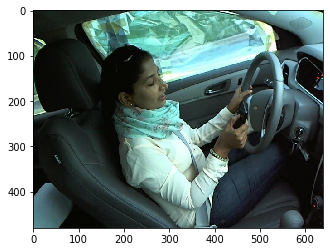

talking on the phone - left


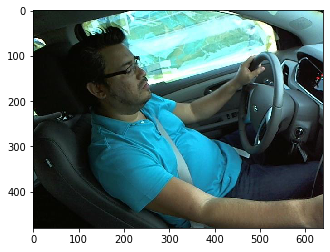

operating the radio


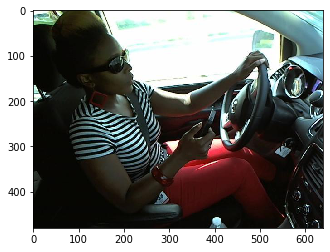

texting - right


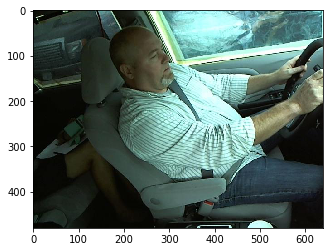

safe driving


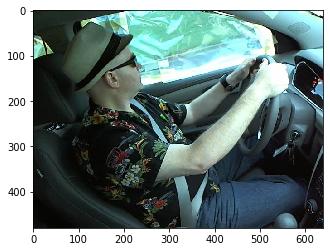

safe driving


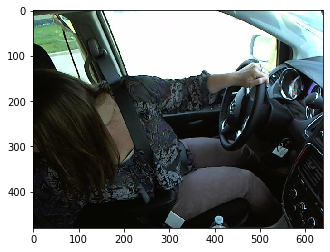

reaching behind


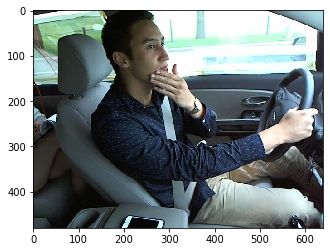

talking on the phone - left


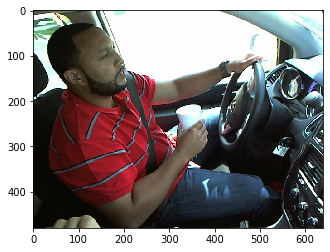

drinking


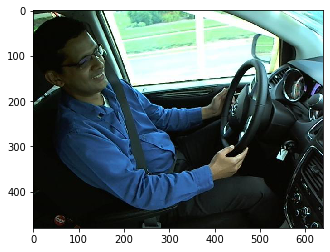

talking to passenger


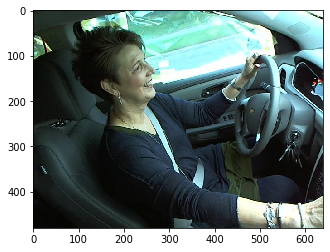

operating the radio


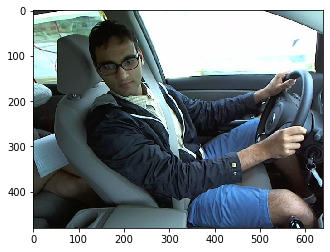

talking to passenger


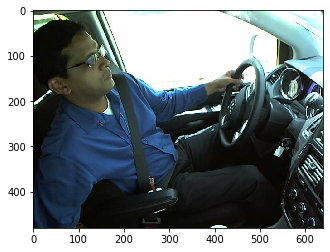

reaching behind


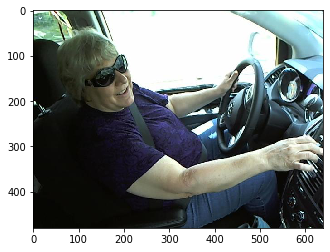

operating the radio


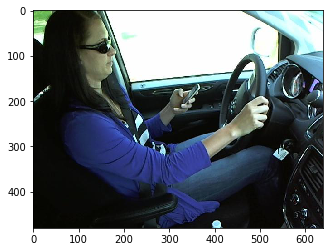

texting - left


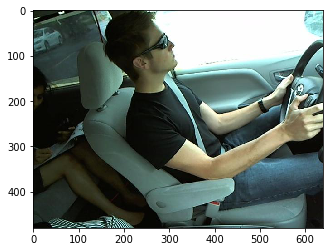

safe driving


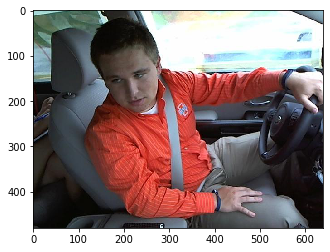

talking to passenger


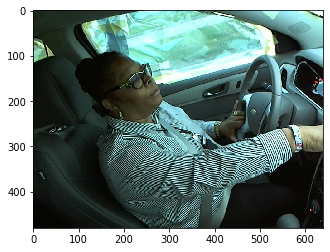

talking on the phone - left


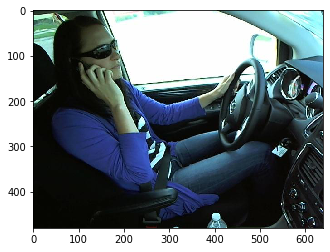

talking on the phone - right


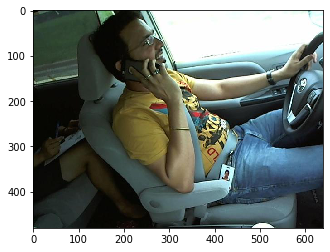

talking on the phone - right


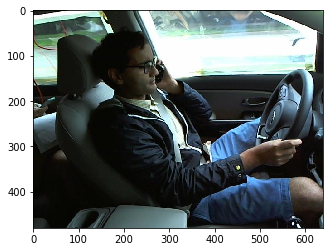

talking on the phone - left


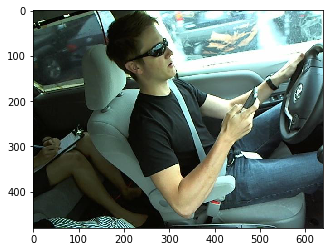

texting - right


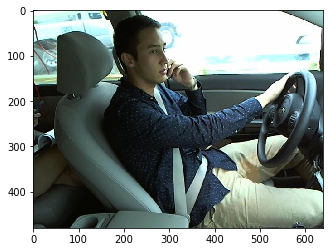

hair and makeup


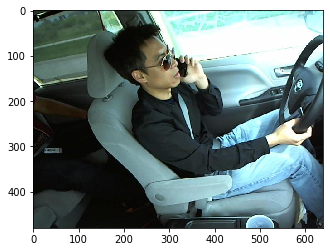

talking on the phone - left


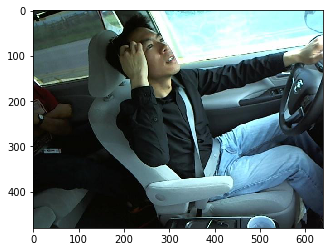

hair and makeup


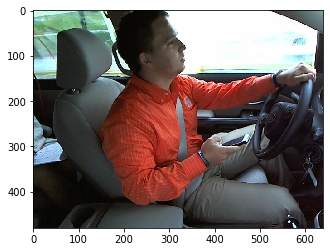

safe driving


In [109]:
# now let's load the test data and do some inference

path_to_test_folder = "imgs/test/"

test_data_images = os.listdir(path_to_test_folder)

number_of_images_to_pick = 100

sample_test_images = np.random.choice(test_data_images,number_of_images_to_pick)

for sample in sample_test_images:
    print(inference(path_to_test_folder+sample,DATA_PATH))

In [115]:
# for creating submission file

def create_submission_file(test_images,model_path,base_path):
    
    df_columns = ["image_id","class"]
    
    rows = []
    
    learn = load_learner(model_path)
    
    for image in tqdm_notebook(test_images):
        img = open_image(base_path + image)
        pred_class,pred_idx,outputs = learn.predict(img)
        
        class_ = classes[str(pred_class)]
        
        rows.append(({"image_id":image,"class":class_}))
        
    df = pd.DataFrame(data = rows, columns = df_columns)
    
    return df    

In [118]:
df_submission = create_submission_file(test_data_images,DATA_PATH,path_to_test_folder)

C:\Users\Sourabh\Anaconda3\envs\fastai\lib\site-packages\ipykernel_launcher.py:11: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  # This is added back by InteractiveShellApp.init_path()


In [119]:
df_submission.head()

,image_id,class
0,img_1.jpg,operating the radio
1,img_10.jpg,operating the radio
2,img_100.jpg,safe driving
3,img_1000.jpg,hair and makeup
4,img_100000.jpg,texting - left


In [120]:
# make a dictionary for classes
classes_rev = {
"safe driving":"c0",
"texting - right":"c1",
"talking on the phone - right":"c2",
"texting - left":"c3",
"talking on the phone - left":"c4",
"operating the radio":"c5",
"drinking":"c6",
"reaching behind":"c7",
"hair and makeup":"c8",
"talking to passenger":"c9"}

In [121]:
classes_rev

{'safe driving': 'c0',
 'texting - right': 'c1',
 'talking on the phone - right': 'c2',
 'texting - left': 'c3',
 'talking on the phone - left': 'c4',
 'operating the radio': 'c5',
 'drinking': 'c6',
 'reaching behind': 'c7',
 'hair and makeup': 'c8',
 'talking to passenger': 'c9'}

In [122]:
df_submission['class'] = df_submission['class'].apply(lambda x: classes_rev[x])

In [140]:
df_submission.head()

,image_id,class
0,img_1.jpg,c5
1,img_10.jpg,c5
2,img_100.jpg,c0
3,img_1000.jpg,c8
4,img_100000.jpg,c3


In [141]:
df_submission.columns = ['img','class']

In [142]:
df_OHE = pd.get_dummies(df_submission['class'])

In [143]:
df_OHE.head()

,c0,c1,c2,c3,c4,c5,c6,c7,c8,c9
0,0,0,0,0,0,1,0,0,0,0
1,0,0,0,0,0,1,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,1,0
4,0,0,0,1,0,0,0,0,0,0


In [144]:
df_submission_final = df_submission.join(df_OHE)

In [145]:
df_submission_final.head()

,img,class,c0,c1,c2,c3,c4,c5,c6,c7,c8,c9
0,img_1.jpg,c5,0,0,0,0,0,1,0,0,0,0
1,img_10.jpg,c5,0,0,0,0,0,1,0,0,0,0
2,img_100.jpg,c0,1,0,0,0,0,0,0,0,0,0
3,img_1000.jpg,c8,0,0,0,0,0,0,0,0,1,0
4,img_100000.jpg,c3,0,0,0,1,0,0,0,0,0,0


In [146]:
df_submission_final.drop(['class'],inplace = False,axis = 1).to_csv("./submission.csv",index  = False)

In [147]:
os.listdir("./")

['.ipynb_checkpoints',
 'Driver_activity_recognition_using_fast_ai(Experiment).ipynb',
 'driver_imgs_list.csv',
 'imgs',
 'sample_submission.csv',
 'submission.csv']

In [148]:
df_submission_final.head()

,img,class,c0,c1,c2,c3,c4,c5,c6,c7,c8,c9
0,img_1.jpg,c5,0,0,0,0,0,1,0,0,0,0
1,img_10.jpg,c5,0,0,0,0,0,1,0,0,0,0
2,img_100.jpg,c0,1,0,0,0,0,0,0,0,0,0
3,img_1000.jpg,c8,0,0,0,0,0,0,0,0,1,0
4,img_100000.jpg,c3,0,0,0,1,0,0,0,0,0,0
